- 201805025 Deniz TÜRKÖZ
- 201805026 Furkan GÜNDEL
- 201805035 Burak AYAN
- 201805075 Beyza ŞAHİN
- 201805093 Zahraa ALTEKREETI

pip install json numpy torch torchvision pillow matplotlib tensorflow tensorflow-ranking


In [ ]:
pip install tensorflow-ranking

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 4.4 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of tensorflow-serving-api to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 87.8 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.15.0
    Uninstalling tensorflow-2.15.0:
      Successfully uninstalled tensorflow-2.15.0


In [ ]:
import json
import torch
from torch.utils.data import DataLoader, Dataset, SubsetRandomSampler
from torchvision import transforms, models
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
import tensorflow as tf
import tensorflow_ranking as tfr
from PIL import Image
import numpy as np
import random
import os
import matplotlib.pyplot as plt
from collections import defaultdict, deque
import torchvision.transforms.functional as TF
from torch.cuda.amp import autocast

# Set random seed for reproducibility
random.seed(47)
np.random.seed(47)
torch.manual_seed(47)

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Dataset class
class LeishmaniaDataset(Dataset):
    def __init__(self, labels_dir, img_dir, transform=None):
        self.img_dir = img_dir
        self.labels_dir = labels_dir
        self.transform = transform
        self.image_files = sorted(os.listdir(self.img_dir), key=lambda x: int(os.path.splitext(x)[0]))
        self.annotation_files = sorted(os.listdir(self.labels_dir), key=lambda x: int(os.path.splitext(x)[0]))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.image_files[idx])
        annotation_path = os.path.join(self.labels_dir, self.annotation_files[idx])
        image = Image.open(img_path).convert("RGB")

        with open(annotation_path) as f:
            annotation = json.load(f)

        boxes = [shape['points'][0] + shape['points'][1] for shape in annotation['shapes'] if shape['shape_type'] == 'rectangle']
        boxes = self.filter_boxes(boxes)

        labels = torch.ones((len(boxes),), dtype=torch.int64)

        if len(boxes) > 0:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            boxes[:, 0::2].clamp_(min=0, max=image.width)
            boxes[:, 1::2].clamp_(min=0, max=image.height)
            boxes[:, [0, 2]] = torch.sort(boxes[:, [0, 2]], dim=1)[0]
            boxes[:, [1, 3]] = torch.sort(boxes[:, [1, 3]], dim=1)[0]
        else:
            boxes = torch.empty((0, 4), dtype=torch.float32)

        target = {'boxes': boxes, 'labels': labels, 'image_id': torch.tensor([idx])}

        if self.transform:
            image, target = self.transform(image, target)

        return image, target

    def filter_boxes(self, boxes, min_size=5):
        filtered_boxes = []
        for box in boxes:
            x1, y1, x2, y2 = box
            if (x2 - x1) > min_size and (y2 - y1) > min_size:
                filtered_boxes.append(box)
        return filtered_boxes

In [ ]:
# Collate function
def collate_fn(batch):
    return tuple(zip(*batch))

# Visualize dataset sample
def visualize_dataset_sample(dataset, num_samples=5):
    indices = random.sample(range(len(dataset)), num_samples)
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 10))

    for i, idx in enumerate(indices):
        image, target = dataset[idx]
        boxes = target['boxes'].cpu().numpy()

        # Convert PIL Image to numpy array for visualization
        image = np.array(image)

        axes[i].imshow(image)
        for box in boxes:
            x1, y1, x2, y2 = box
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='red', linewidth=2)
            axes[i].add_patch(rect)
        axes[i].set_title(f'Sample {idx}')
        axes[i].axis('off')

    plt.show()

In [ ]:
# Custom transforms for both image and bounding boxes
class ComposeTransforms:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

class ToTensor:
    def __call__(self, image, target):
        image = transforms.ToTensor()(image)
        return image, target

class RandomHorizontalFlip:
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, image, target):
        if random.random() < self.p:
            image = TF.hflip(image)
            width = image.width
            for box in target['boxes']:
                box[0], box[2] = width - box[2], width - box[0]
        return image, target

class RandomVerticalFlip:
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, image, target):
        if random.random() < self.p:
            image = TF.vflip(image)
            height = image.height
            for box in target['boxes']:
                box[1], box[3] = height - box[3], height - box[1]
        return image, target

In [ ]:
# Define transforms with horizontal and vertical flip
transform = ComposeTransforms([
    RandomHorizontalFlip(p=0.5),
    RandomVerticalFlip(p=0.5),
    ToTensor()
])

# Directory paths
labels_dir = '/content/drive/MyDrive/Colab/Labels-json'
img_dir = '/content/drive/MyDrive/Colab/leishmania'

# Create dataset
dataset = LeishmaniaDataset(labels_dir=labels_dir, img_dir=img_dir, transform=transform)

# Split dataset into training and testing sets
dataset_size = len(dataset)
indices = list(range(dataset_size))
split = int(np.floor(0.2 * dataset_size))
np.random.shuffle(indices)
train_indices, test_indices = indices[split:], indices[:split]

# Create data samplers and loaders
train_sampler = SubsetRandomSampler(train_indices)
test_sampler = SubsetRandomSampler(test_indices)

batch_size = 16
gradient_accumulation_steps = 2

train_loader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, collate_fn=collate_fn)
test_loader = DataLoader(dataset, batch_size=16, sampler=test_sampler, collate_fn=collate_fn)

print(f"Number of training samples: {len(train_indices)}")
print(f"Number of testing samples: {len(test_indices)}")

Number of training samples: 115
Number of testing samples: 28


In [ ]:
# Define the model
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
num_classes = 2  # Including background
backbone = resnet_fpn_backbone('resnet50', pretrained=True)
model = FasterRCNN(backbone, num_classes=num_classes)
model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [ ]:
# Initialize optimizer and learning rate scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(params, lr=0.0001, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=0.001, steps_per_epoch=len(train_loader), epochs=10)

# Training function
def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
    model.train()
    metric_logger = defaultdict(lambda: deque(maxlen=10))
    header = f"Epoch: [{epoch}]"

    optimizer.zero_grad()
    for step, (images, targets) in enumerate(data_loader):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        losses.backward()

        # Accumulate gradients
        if (step + 1) % gradient_accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()

        metric_logger['loss'].append(loss_value)

        if (step + 1) % print_freq == 0:
            print(f"{header}  loss: {np.mean(metric_logger['loss'])}")

    # If there are remaining accumulated gradients, step optimizer
    if len(data_loader) % gradient_accumulation_steps != 0:
        optimizer.step()
        optimizer.zero_grad()

    return np.mean(metric_logger['loss'])

In [ ]:
# Initialize MeanAveragePrecisionMetric
map_metric = tfr.keras.metrics.MeanAveragePrecisionMetric(name="mAP", topn=100)

def evaluate(model, test_loader, device, metric, max_detections=100, score_threshold=0.5):
    model.eval()  # Set the model to evaluation mode

    y_true = []
    y_pred_scores = []

    with torch.no_grad():
        for images, targets in test_loader:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Make predictions
            outputs = model(images)

            for target, output in zip(targets, outputs):
                true_labels = target['labels'].cpu().numpy()
                pred_scores = output['scores'].cpu().numpy()
                pred_labels = output['labels'].cpu().numpy()

                # Filter predictions by score threshold
                keep = pred_scores >= score_threshold
                pred_scores = pred_scores[keep]
                pred_labels = pred_labels[keep]

                # Only consider positive class predictions
                true_labels = (true_labels == 1).astype(np.float32)
                pred_scores = (pred_labels == 1).astype(np.float32) * pred_scores

                # Ensure fixed length by padding or truncating
                true_labels_padded = np.pad(true_labels, (0, max_detections - len(true_labels)), 'constant', constant_values=0)[:max_detections]
                pred_scores_padded = np.pad(pred_scores, (0, max_detections - len(pred_scores)), 'constant', constant_values=0)[:max_detections]

                y_true.append(true_labels_padded)
                y_pred_scores.append(pred_scores_padded)

    # Convert lists to numpy arrays
    y_true = np.stack(y_true, axis=0)
    y_pred_scores = np.stack(y_pred_scores, axis=0)

    # Update mAP metric
    metric.update_state(tf.convert_to_tensor(y_true), tf.convert_to_tensor(y_pred_scores))

    # Calculate mAP score
    map_score = metric.result().numpy()

    # Reset metric states for the next evaluation
    metric.reset_states()

    return map_score

In [ ]:
# Training loop with adjusted parameters
num_epochs = 50
train_losses = []
map_scores = []

for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch, print_freq=5)
    train_losses.append(train_loss)
    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}")

    # Evaluate on the test set
    map_score = evaluate(model, test_loader, device, map_metric)
    map_scores.append(map_score)
    print(f"Epoch {epoch + 1}/{num_epochs}, mAP: {map_score:.4f}")

    # Step the learning rate scheduler
    lr_scheduler.step()

# Save the final trained model
final_model_path = '/content/drive/MyDrive/Colab Notebooks/final_model.pth'
torch.save(model.state_dict(), final_model_path)
print(f"Final model saved to {final_model_path}")

Epoch: [0]  loss: 1.265057921409607
Epoch 1/50, Train Loss: 1.1438
Epoch 1/50, mAP: 0.1225
Epoch: [1]  loss: 0.8933562517166138
Epoch 2/50, Train Loss: 0.8628
Epoch 2/50, mAP: 0.1329
Epoch: [2]  loss: 0.7165226459503173
Epoch 3/50, Train Loss: 0.8010
Epoch 3/50, mAP: 0.1331
Epoch: [3]  loss: 0.768133533000946
Epoch 4/50, Train Loss: 0.7985
Epoch 4/50, mAP: 0.1217
Epoch: [4]  loss: 0.774689519405365
Epoch 5/50, Train Loss: 0.7583
Epoch 5/50, mAP: 0.1204
Epoch: [5]  loss: 0.7253153085708618
Epoch 6/50, Train Loss: 0.7199
Epoch 6/50, mAP: 0.1357
Epoch: [6]  loss: 0.6767411470413208
Epoch 7/50, Train Loss: 0.7806
Epoch 7/50, mAP: 0.1349
Epoch: [7]  loss: 0.8740872979164124
Epoch 8/50, Train Loss: 0.8806
Epoch 8/50, mAP: 0.1283
Epoch: [8]  loss: 0.767538058757782
Epoch 9/50, Train Loss: 0.7116
Epoch 9/50, mAP: 0.1285
Epoch: [9]  loss: 0.7685389518737793
Epoch 10/50, Train Loss: 0.7504
Epoch 10/50, mAP: 0.1508
Epoch: [10]  loss: 0.7432922661304474
Epoch 11/50, Train Loss: 0.6766
Epoch 11/50,

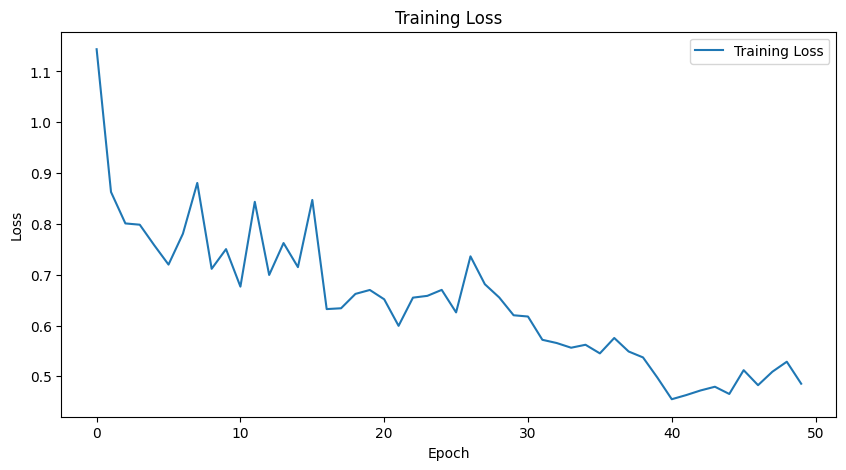

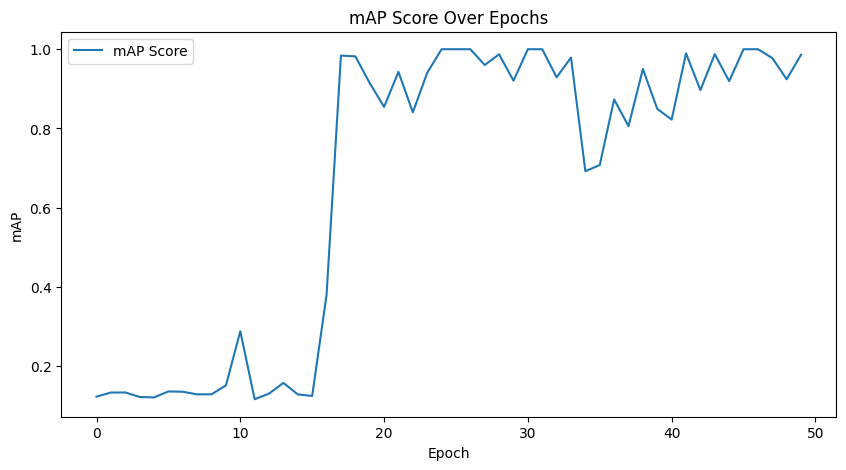

In [ ]:
# Plot the training loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()
plt.show()

# Plot the mAP scores
plt.figure(figsize=(10, 5))
plt.plot(map_scores, label='mAP Score')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('mAP Score Over Epochs')
plt.legend()
plt.show()

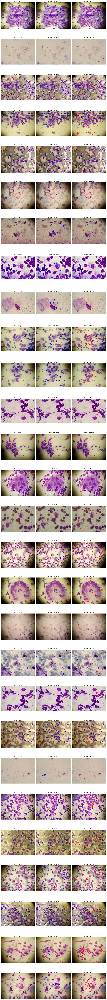

In [ ]:
def visualize_predictions(model, data_loader, device, num_images=28):
    model.eval()
    images, targets, predictions = [], [], []

    # Get all images and targets from the data loader
    all_images = []
    all_targets = []
    for images_batch, targets_batch in data_loader:
        all_images.extend(images_batch)
        all_targets.extend(targets_batch)

    # Randomly sample indices for visualization
    random_indices = random.sample(range(len(all_images)), num_images)

    with torch.no_grad():
        for idx in random_indices:
            image = all_images[idx].unsqueeze(0).to(device)  # Add batch dimension
            target = all_targets[idx]

            output = model(image)[0]  # Get predictions for the image

            # Append images and masks for plotting
            images.append(image.squeeze(0).cpu())  # Remove batch dimension and move to CPU
            targets.append(target)
            predictions.append(output)

    fig, axs = plt.subplots(num_images, 3, figsize=(15, num_images * 5))
    for i in range(num_images):
        image_np = images[i].permute(1, 2, 0).numpy()
        target_boxes = targets[i]['boxes'].cpu().numpy()
        pred_boxes = predictions[i]['boxes'].cpu().numpy()
        pred_scores = predictions[i]['scores'].cpu().numpy()

        axs[i, 0].imshow(image_np)
        axs[i, 0].set_title("Input Image")
        axs[i, 0].axis('off')

        for box in target_boxes:
            x1, y1, x2, y2 = box
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='blue', linewidth=2)
            axs[i, 1].add_patch(rect)
        axs[i, 1].imshow(image_np)
        axs[i, 1].set_title("Ground Truth Boxes")
        axs[i, 1].axis('off')

        for box, score in zip(pred_boxes, pred_scores):
            if score > 0.5:  # Only display predictions with a score above 0.5
                x1, y1, x2, y2 = box
                rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, color='red', linewidth=2)
                axs[i, 2].add_patch(rect)
        axs[i, 2].imshow(image_np)
        axs[i, 2].set_title("Predicted Boxes")
        axs[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Call the function to visualize random predictions
visualize_predictions(model, test_loader, device)